# BCO074C Minor Project

## Advanced Image Detection and Segmentation with UNet and MNISTDD-RGB

Professional end-to-end pipeline with strict audit fixes, clean sectioning, and export-ready outputs.

## SECTION 0 — DEPENDENCIES

In [1]:
import os, sys, subprocess

ON_KAGGLE = os.path.exists('/kaggle/working')
ON_COLAB = 'google.colab' in sys.modules

if ON_KAGGLE or ON_COLAB:
    pkgs = ['ultralytics>=8.4.0', 'seaborn', 'pillow', 'pandas', 'pyyaml']
    subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', *pkgs], check=True)

print('Dependencies ready.')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.8 MB/s eta 0:00:00
Dependencies ready.


## SECTION 1 — CONFIGURATION

In [2]:
# Cell 1A — Imports
# Standard library
import random, shutil, gc, multiprocessing, warnings, glob, zipfile

# Numeric
import numpy as np
import pandas as pd

# PyTorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# Torchvision
from torchvision import datasets, transforms
from torchvision.transforms import functional as TF

# Ultralytics
from ultralytics import YOLO

# Visualisation
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# Utilities
from PIL import Image
from tqdm.auto import tqdm
from IPython.display import display, Image as IPyImage, FileLink

warnings.filterwarnings('ignore')
%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Cell 1B — Hyperparameters and paths
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

import torch._dynamo
torch._dynamo.config.suppress_errors = True

CANVAS_SIZE = 128
DIGIT_SIZE = 28
MIN_DIGITS = 2
MAX_DIGITS = 2
PIXEL_THRESH = 0.3

NUM_TRAIN = 100000
NUM_VAL = 10000
NUM_TEST = 10000

NUM_CLASSES_DET = 10
NUM_CLASSES_SEG = 11

YOLO_EPOCHS = 50
YOLO_PATIENCE = 10
YOLO_IMGSZ = 128
UNET_EPOCHS = 20
UNET_LR = 1e-3
UNET_PATIENCE = 5

NUM_WORKERS = max(1, min(multiprocessing.cpu_count() - 1, 4))

if torch.cuda.is_available():
    total_vram_gb = sum(torch.cuda.get_device_properties(i).total_memory for i in range(torch.cuda.device_count())) / (1024 ** 3)
else:
    total_vram_gb = 0.0

if total_vram_gb >= 28:
    YOLO_BATCH, UNET_BATCH = 256, 512
elif total_vram_gb >= 14:
    YOLO_BATCH, UNET_BATCH = 128, 256
elif total_vram_gb >= 8:
    YOLO_BATCH, UNET_BATCH = 64, 128
elif total_vram_gb >= 5:
    YOLO_BATCH, UNET_BATCH = 32, 64
else:
    YOLO_BATCH, UNET_BATCH = 16, 16

ROOT_DIR = os.getcwd()
DATASET_DIR = os.path.join(ROOT_DIR, 'digit_dataset')
YOLO_PROJECT = os.path.join(ROOT_DIR, 'runs')
YOLO_NAME = 'digit_detector'
UNET_CKPT = os.path.join(ROOT_DIR, 'unet_best.pt')
OFFICIAL_TEST_DIR = os.path.join(ROOT_DIR, 'official_mnistdd_test')

print(f'Device={DEVICE} | VRAM≈{total_vram_gb:.1f}GB | YOLO_BATCH={YOLO_BATCH} | UNET_BATCH={UNET_BATCH} | NUM_WORKERS={NUM_WORKERS}')

Device=cuda | VRAM≈29.1GB | YOLO_BATCH=256 | UNET_BATCH=512 | NUM_WORKERS=3


## SECTION 2 — DATA GENERATION

In [4]:
# Cell 2A — Download MNIST
_tf = transforms.ToTensor()
mnist_train = datasets.MNIST('./data', train=True, download=True, transform=_tf)
mnist_test = datasets.MNIST('./data', train=False, download=True, transform=_tf)

_mnist_train_imgs = mnist_train.data.numpy().astype(np.float32) / 255.0
_mnist_train_labels = mnist_train.targets.numpy()
_mnist_test_imgs = mnist_test.data.numpy().astype(np.float32) / 255.0
_mnist_test_labels = mnist_test.targets.numpy()

print(f'MNIST train: {len(mnist_train)}, test: {len(mnist_test)}')

100%|██████████| 9.91M/9.91M [00:00<00:00, 60.9MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.52MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 14.6MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 15.8MB/s]


MNIST train: 60000, test: 10000


In [5]:
# Cell 2B — Scene generation functions
def generate_and_save_scene(mnist_imgs, mnist_labels, fname, img_dir, mask_dir, lbl_dir, canvas_sz=CANVAS_SIZE, digit_sz=DIGIT_SIZE, augment=False):
    n = random.randint(MIN_DIGITS, MAX_DIGITS)
    bg_color = np.random.rand(3).astype(np.float32) * 0.4
    canvas = np.ones((3, canvas_sz, canvas_sz), dtype=np.float32) * bg_color[:, None, None]
    noise = np.random.randn(3, canvas_sz, canvas_sz).astype(np.float32) * 0.05
    canvas = np.clip(canvas + noise, 0, 1)
    mask = np.zeros((canvas_sz, canvas_sz), dtype=np.uint8)
    boxes, labels = [], []
    for _ in range(n):
        idx = random.randint(0, len(mnist_imgs) - 1)
        img_np = mnist_imgs[idx]
        label = int(mnist_labels[idx])

        if augment:
            from PIL import Image as _PIL_Image

            # Random scale: resize digit between 80% and 120% of original size
            _scale = random.uniform(0.8, 1.2)
            _new_size = int(digit_sz * _scale)
            _new_size = max(20, min(_new_size, 40))
            _pil_d = _PIL_Image.fromarray((img_np * 255).astype(np.uint8), mode='L')
            _pil_d = _pil_d.resize((_new_size, _new_size), _PIL_Image.BILINEAR)

            # Random rotation: rotate between -15 and +15 degrees
            _angle = random.uniform(-15.0, 15.0)
            _pil_d = _pil_d.rotate(_angle, resample=_PIL_Image.BILINEAR, expand=False, fillcolor=0)
            img_np = np.array(_pil_d, dtype=np.float32) / 255.0

            # Update digit size for placement
            _dz = _new_size
        else:
            # Use raw digit without augmentation
            _dz = digit_sz

        x = random.randint(0, canvas_sz - _dz)
        y = random.randint(0, canvas_sz - _dz)
        digit_color = np.random.rand(3).astype(np.float32) * 0.5 + 0.5
        digit_mask = img_np > PIXEL_THRESH
        for c in range(3):
            canvas[c, y:y+_dz, x:x+_dz][digit_mask] = digit_color[c] * img_np[digit_mask]
        mask[y:y+_dz, x:x+_dz][digit_mask] = label + 1
        boxes.append((x, y, x + _dz, y + _dz))
        labels.append(label)
    img_uint8 = (canvas.transpose(1, 2, 0) * 255).astype(np.uint8)
    Image.fromarray(img_uint8).save(os.path.join(img_dir, fname + '.png'))
    Image.fromarray(mask).save(os.path.join(mask_dir, fname + '.png'))
    with open(os.path.join(lbl_dir, fname + '.txt'), 'w') as f:
        for (x1, y1, x2, y2), lbl in zip(boxes, labels):
            cx = ((x1 + x2) / 2) / canvas_sz
            cy = ((y1 + y2) / 2) / canvas_sz
            w = (x2 - x1) / canvas_sz
            h = (y2 - y1) / canvas_sz
            f.write(f'{lbl} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n')
    return boxes, labels

def generate_split(mnist_imgs, mnist_labels, n_scenes, split_name, augment=False):
    img_dir = os.path.join(DATASET_DIR, 'images', split_name)
    lbl_dir = os.path.join(DATASET_DIR, 'labels', split_name)
    mask_dir = os.path.join(DATASET_DIR, 'masks', split_name)
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    os.makedirs(mask_dir, exist_ok=True)
    split_boxes, split_labels = [], []
    for i in tqdm(range(n_scenes), desc=f'Generating {split_name}'):
        fname = f'scene_{i:05d}'
        b, l = generate_and_save_scene(mnist_imgs, mnist_labels, fname, img_dir, mask_dir, lbl_dir, augment=augment)
        split_boxes.append(b)
        split_labels.append(l)
    return split_boxes, split_labels

print('Scene generation functions ready.')

Scene generation functions ready.


In [6]:
# Cell 2C — Generate or skip dataset
os.makedirs(DATASET_DIR, exist_ok=True)
_train_done = os.path.exists(os.path.join(DATASET_DIR, 'images', 'train', f'scene_{NUM_TRAIN-1:05d}.png'))
_val_done = os.path.exists(os.path.join(DATASET_DIR, 'images', 'val', f'scene_{NUM_VAL-1:05d}.png'))
_test_done = os.path.exists(os.path.join(DATASET_DIR, 'images', 'test', f'scene_{NUM_TEST-1:05d}.png'))

def _load_labels(split, n):
    lbl_dir = os.path.join(DATASET_DIR, 'labels', split)
    boxes, labels = [], []
    for i in range(n):
        path = os.path.join(lbl_dir, f'scene_{i:05d}.txt')
        scene_boxes, scene_labels = [], []
        if os.path.exists(path):
            with open(path, 'r') as rf:
                for line in rf:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        cls_id = int(parts[0])
                        cx, cy, w, h = map(float, parts[1:])
                        x1 = int((cx - w / 2) * CANVAS_SIZE)
                        y1 = int((cy - h / 2) * CANVAS_SIZE)
                        x2 = int((cx + w / 2) * CANVAS_SIZE)
                        y2 = int((cy + h / 2) * CANVAS_SIZE)
                        scene_boxes.append((x1, y1, x2, y2))
                        scene_labels.append(cls_id)
        boxes.append(scene_boxes)
        labels.append(scene_labels)
    return boxes, labels

if _train_done and _val_done and _test_done:
    print('Dataset already exists. Reloading labels from YOLO txt files...')
    train_boxes, train_labels = _load_labels('train', NUM_TRAIN)
    val_boxes, val_labels = _load_labels('val', NUM_VAL)
    test_boxes, test_labels = _load_labels('test', NUM_TEST)
else:
    print('Generating training split...')
    train_boxes, train_labels = generate_split(_mnist_train_imgs, _mnist_train_labels, NUM_TRAIN, 'train', augment=True)
    print('Generating validation split...')
    val_boxes, val_labels = generate_split(_mnist_train_imgs, _mnist_train_labels, NUM_VAL, 'val', augment=False)
    print('Generating test split...')
    test_boxes, test_labels = generate_split(_mnist_test_imgs, _mnist_test_labels, NUM_TEST, 'test', augment=False)
    gc.collect()

data_yaml_path = os.path.join(DATASET_DIR, 'data.yaml')
abs_dataset = os.path.abspath(DATASET_DIR)
with open(data_yaml_path, 'w') as f:
    f.write(f'path: {abs_dataset}\n')
    f.write('train: images/train\n')
    f.write('val: images/val\n')
    f.write('test: images/test\n')
    f.write(f'nc: {NUM_CLASSES_DET}\n')
    f.write("names: ['0','1','2','3','4','5','6','7','8','9']\n")

print(f'Dataset ready -> Train: {NUM_TRAIN}, Val: {NUM_VAL}, Test: {NUM_TEST}')
print(f'data.yaml written: {data_yaml_path}')

Generating training split...


Generating train:   0%|          | 0/100000 [00:00<?, ?it/s]

Generating validation split...


Generating val:   0%|          | 0/10000 [00:00<?, ?it/s]

Generating test split...


Generating test:   0%|          | 0/10000 [00:00<?, ?it/s]

Dataset ready -> Train: 100000, Val: 10000, Test: 10000
data.yaml written: /kaggle/working/digit_dataset/data.yaml


## SECTION 3 — DATASET VISUALISATION

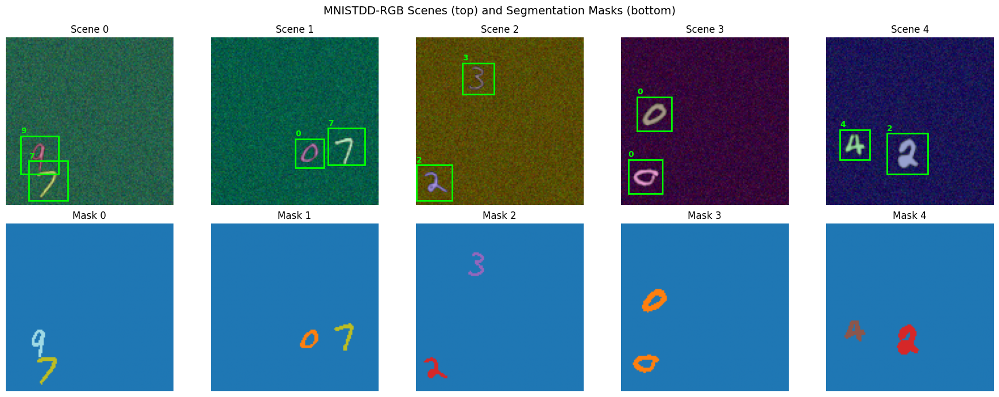

In [7]:
# Cell 3A — Sample scenes plot
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
train_img_dir = os.path.join(DATASET_DIR, 'images', 'train')
train_mask_dir = os.path.join(DATASET_DIR, 'masks', 'train')
for i in range(5):
    fname = f'scene_{i:05d}.png'
    img_np = np.array(Image.open(os.path.join(train_img_dir, fname)))
    mask_np = np.array(Image.open(os.path.join(train_mask_dir, fname)))
    ax = axes[0, i]
    ax.imshow(img_np)
    for box, lbl in zip(train_boxes[i], train_labels[i]):
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, max(y1-2, 0), str(lbl), color='lime', fontsize=10, weight='bold')
    ax.set_title(f'Scene {i}')
    ax.axis('off')
    ax2 = axes[1, i]
    ax2.imshow(mask_np, cmap='tab20', vmin=0, vmax=10)
    ax2.set_title(f'Mask {i}')
    ax2.axis('off')
plt.suptitle('MNISTDD-RGB Scenes (top) and Segmentation Masks (bottom)', fontsize=14)
plt.tight_layout()
plt.savefig('mnistdd_rgb_samples.png', bbox_inches='tight', dpi=120)
plt.show()
plt.close('all')

## SECTION 4 — DETECTION MODEL: YOLO

In [8]:
# Cell 4A — Train YOLO
yolo_model = YOLO('yolov8s.pt')

if torch.cuda.device_count() >= 2:
    yolo_device = list(range(torch.cuda.device_count()))
    print(f"YOLO: using {torch.cuda.device_count()} GPUs: {yolo_device}")
elif torch.cuda.is_available():
    yolo_device = 0
    print("YOLO: using 1 GPU")
else:
    yolo_device = "cpu"
    print("YOLO: using CPU")

train_results = yolo_model.train(
    data=os.path.join(DATASET_DIR, "data.yaml"),
    epochs=YOLO_EPOCHS,
    patience=YOLO_PATIENCE,
    imgsz=YOLO_IMGSZ,
    batch=YOLO_BATCH,
    device=yolo_device,
    project=YOLO_PROJECT,
    name=YOLO_NAME,
    exist_ok=True,
    verbose=True,
    workers=NUM_WORKERS,
    seed=SEED,
    amp=False,
    half=True,
    cache="ram",
    cos_lr=True,
    warmup_epochs=5,
    rect=False,
    close_mosaic=5,
    val=True,
    augment=False,
    deterministic=True,
 )
print("YOLO training complete.")

YOLO: using 2 GPUs: [0, 1]
Ultralytics 8.4.24 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
                                                       CUDA:1 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=False, angle=1.0, augment=False, auto_augment=randaugment, batch=256, bgr=0.0, box=7.5, cache=ram, cfg=None, classes=None, close_mosaic=5, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/digit_dataset/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=True, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=128, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name

Loaded detector from: /kaggle/working/runs/digit_detector/weights/best.pt


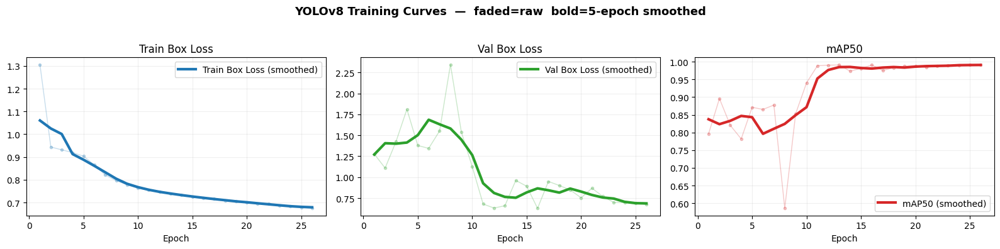

In [9]:
# Cell 4B — Load best weights and plot training curves
del yolo_model
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
best_yolo_path = os.path.join(YOLO_PROJECT, YOLO_NAME, 'weights', 'best.pt')
if not os.path.exists(best_yolo_path):
    best_yolo_path = os.path.join(YOLO_PROJECT, YOLO_NAME, 'weights', 'last.pt')
detector = YOLO(best_yolo_path)
print(f'Loaded detector from: {best_yolo_path}')
results_csv = os.path.join(YOLO_PROJECT, YOLO_NAME, 'results.csv')
if not os.path.exists(results_csv):
    print(f'results.csv not found at {results_csv}')
else:
    df = pd.read_csv(results_csv)
    epochs = df.index.values + 1
    window = 5
    metrics = [('train/box_loss', 'Train Box Loss', '#1f77b4'), ('val/box_loss', 'Val Box Loss', '#2ca02c'), ('metrics/mAP50(B)', 'mAP50', '#d62728')]
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    for ax, (col, label, colour) in zip(axes, metrics):
        if col not in df.columns:
            ax.axis('off')
            continue
        values = df[col].values
        smoothed = pd.Series(values).rolling(window=window, min_periods=1, center=True).mean().values
        ax.plot(epochs, values, color=colour, lw=1.0, alpha=0.25, marker='o', markersize=3)
        ax.plot(epochs, smoothed, color=colour, lw=3.0, label=f'{label} (smoothed)')
        ax.set_title(label)
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.2)
        ax.legend()
    fig.suptitle('YOLOv8 Training Curves  —  faded=raw  bold=5-epoch smoothed', fontsize=13, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig('yolo_training_curves.png', bbox_inches='tight', dpi=120)
    plt.show()
    plt.close('all')

In [10]:
# Cell 4C — Detection evaluation
def compute_iou(b1, b2):
    xi1 = max(b1[0], b2[0]); yi1 = max(b1[1], b2[1])
    xi2 = min(b1[2], b2[2]); yi2 = min(b1[3], b2[3])
    inter = max(0, xi2-xi1) * max(0, yi2-yi1)
    a1 = (b1[2]-b1[0]) * (b1[3]-b1[1])
    a2 = (b2[2]-b2[0]) * (b2[3]-b2[1])
    return inter / (a1 + a2 - inter + 1e-8)

def evaluate_detection(detector_model, test_images_dir, gt_boxes_list, gt_labels_list, iou_thresh=0.5):
    metrics = {c: {'tp': 0, 'fp': 0, 'fn': 0} for c in range(NUM_CLASSES_DET)}
    total_gt = 0
    total_correct = 0
    results = detector_model.predict(source=test_images_dir, imgsz=YOLO_IMGSZ, conf=0.25, verbose=False, device=0 if torch.cuda.is_available() else 'cpu')
    results_sorted = sorted(results, key=lambda r: os.path.basename(r.path))
    for res, gt_bxs, gt_lbls in zip(results_sorted, gt_boxes_list, gt_labels_list):
        pred_boxes = res.boxes.xyxy.cpu().numpy()
        pred_cls = res.boxes.cls.cpu().numpy().astype(int)
        pred_conf = res.boxes.conf.cpu().numpy()
        order = np.argsort(-pred_conf)
        pred_boxes = pred_boxes[order]
        pred_cls = pred_cls[order]
        total_gt += len(gt_lbls)
        matched_gt = set()
        for pb, pc in zip(pred_boxes, pred_cls):
            best_iou, best_j = 0, -1
            for j, (gb, gc) in enumerate(zip(gt_bxs, gt_lbls)):
                if j in matched_gt:
                    continue
                iou = compute_iou(pb, gb)
                if iou > best_iou and pc == gc:
                    best_iou = iou
                    best_j = j
            if best_iou >= iou_thresh and best_j >= 0:
                metrics[pc]['tp'] += 1
                matched_gt.add(best_j)
                total_correct += 1
            elif 0 <= pc < NUM_CLASSES_DET:
                metrics[pc]['fp'] += 1
        for j, gc in enumerate(gt_lbls):
            if j not in matched_gt:
                metrics[gc]['fn'] += 1
    det_accuracy = total_correct / (total_gt + 1e-8)
    return metrics, det_accuracy, total_gt, total_correct

test_img_dir = os.path.join(DATASET_DIR, 'images', 'test')
det_metrics, det_accuracy, det_total_gt, det_total_correct = evaluate_detection(detector, test_img_dir, test_boxes, test_labels)
print(f'Detection Accuracy: {det_accuracy:.4f} ({det_total_correct}/{det_total_gt} objects)')
print()
print(f"{'Class':>6} | {'Prec':>7} | {'Recall':>7} | {'F1':>7} | {'TP':>5} {'FP':>5} {'FN':>5}")
print('-' * 60)
all_tp = all_fp = all_fn = 0
per_class_det = {}
for c in range(NUM_CLASSES_DET):
    tp = det_metrics[c]['tp']; fp = det_metrics[c]['fp']; fn = det_metrics[c]['fn']
    prec = tp / (tp + fp + 1e-8)
    rec = tp / (tp + fn + 1e-8)
    f1 = 2 * prec * rec / (prec + rec + 1e-8)
    per_class_det[c] = {'precision': prec, 'recall': rec, 'f1': f1}
    print(f'{c:>6} | {prec:>7.4f} | {rec:>7.4f} | {f1:>7.4f} | {tp:>5} {fp:>5} {fn:>5}')
    all_tp += tp; all_fp += fp; all_fn += fn
overall_prec = all_tp / (all_tp + all_fp + 1e-8)
overall_rec = all_tp / (all_tp + all_fn + 1e-8)
overall_f1 = 2 * overall_prec * overall_rec / (overall_prec + overall_rec + 1e-8)
print('-' * 60)
print(f"{'TOTAL':>6} | {overall_prec:>7.4f} | {overall_rec:>7.4f} | {overall_f1:>7.4f} | {all_tp:>5} {all_fp:>5} {all_fn:>5}")

WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Detection Accuracy: 0.9792 (19585/20000 objects)

 Class |    Prec |  Recall |      F1 |    TP    FP    FN
------------------------------------------------------------
     0 |  0.8770 |  0.9938 |  0.9318 |  1933   271    12
     1 |  0.8515 |  0.9783 |  0.9105 |  2253   393    50
     2 |  0.9116 |  0.9786 |  0.9439 |  2011   195    44
     3 |  0.9589 |  0.9827 |  0.9706 |  1983    85    35
     4 |  0.9337 |  0.9831 |  0.9577 |  1915   136    33
     5

## SECTION 5 — SEGMENTATION MODEL: U-NET

In [11]:
# Cell 5A — Dataset and DataLoaders
class SegDatasetDisk(Dataset):
    def __init__(self, split_name):
        self.img_dir = os.path.join(DATASET_DIR, 'images', split_name)
        self.mask_dir = os.path.join(DATASET_DIR, 'masks', split_name)
        self.fnames = sorted(os.listdir(self.img_dir))
        print(f'  {split_name}: {len(self.fnames)} scenes')

    def __len__(self):
        return len(self.fnames)

    def __getitem__(self, idx):
        img_pil = Image.open(os.path.join(self.img_dir, self.fnames[idx])).convert('RGB')
        mask_pil = Image.open(os.path.join(self.mask_dir, self.fnames[idx]))
        img = TF.to_tensor(img_pil)
        mask = torch.tensor(np.array(mask_pil), dtype=torch.long)
        del img_pil
        del mask_pil
        return img, mask

train_seg_ds = SegDatasetDisk('train')
val_seg_ds = SegDatasetDisk('val')
test_seg_ds = SegDatasetDisk('test')

_nw = 0
_pf = None
_pw = False

train_seg_dl = DataLoader(
    train_seg_ds, batch_size=UNET_BATCH, shuffle=True, drop_last=True,
    num_workers=0, pin_memory=False,
    prefetch_factor=_pf, persistent_workers=_pw,
 )
val_seg_dl = DataLoader(
    val_seg_ds, batch_size=UNET_BATCH * 2, shuffle=False,
    num_workers=0, pin_memory=False,
    prefetch_factor=_pf, persistent_workers=_pw,
 )
test_seg_dl = DataLoader(
    test_seg_ds, batch_size=UNET_BATCH * 2, shuffle=False,
    num_workers=0, pin_memory=False,
    prefetch_factor=_pf, persistent_workers=_pw,
 )

print(f'Workers: {_nw}  prefetch: {_pf}  persistent: {_pw}')
print(f'Dataloaders ready -> Train: {len(train_seg_dl)} | '
      f'Val: {len(val_seg_dl)} | Test: {len(test_seg_dl)}')

  train: 100000 scenes
  val: 10000 scenes
  test: 10000 scenes
Workers: 0  prefetch: None  persistent: False
Dataloaders ready -> Train: 195 | Val: 10 | Test: 10


In [12]:
# Cell 5B — Model definition and setup
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True), nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, num_classes=11):
        super().__init__()
        self.inc = DoubleConv(in_ch, 32)
        self.down1 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(32, 64))
        self.down2 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(64, 128))
        self.down3 = nn.Sequential(nn.MaxPool2d(2), DoubleConv(128, 256))
        self.up1 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv1 = DoubleConv(256, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv2 = DoubleConv(128, 64)
        self.up3 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv3 = DoubleConv(64, 32)
        self.outc = nn.Conv2d(32, num_classes, 1)
    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x = self.up1(x4)
        x = torch.cat([x, x3], dim=1)
        x = self.conv1(x)
        x = self.up2(x)
        x = torch.cat([x, x2], dim=1)
        x = self.conv2(x)
        x = self.up3(x)
        x = torch.cat([x, x1], dim=1)
        x = self.conv3(x)
        return self.outc(x)

unet = UNet(in_ch=3, num_classes=11).to(DEVICE)
if torch.cuda.device_count() >= 2:
    unet = nn.DataParallel(unet)
if hasattr(torch, 'compile') and torch.cuda.is_available():
    unet = torch.compile(unet, mode='reduce-overhead')
n_params = sum(p.numel() for p in (unet.module.parameters() if hasattr(unet, 'module') else unet.parameters()))
print(f'U-Net instantiated. Params: {n_params:,}')

U-Net instantiated. Params: 1,927,339


In [13]:
# Cell 5C — Train U-Net
optimizer = torch.optim.AdamW(unet.parameters(), lr=UNET_LR, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)
criterion = nn.CrossEntropyLoss()
use_amp = torch.cuda.is_available()
scaler = torch.amp.GradScaler('cuda', enabled=use_amp)
best_val_loss = float('inf')
patience_counter = 0
history = {'train_loss': [], 'val_loss': []}

for epoch in range(1, UNET_EPOCHS + 1):
    unet.train()
    running_loss = torch.tensor(0.0, device=DEVICE)

    pbar = tqdm(train_seg_dl,
                desc=f'Epoch {epoch:2d}/{UNET_EPOCHS} [train]',
                leave=False,
                dynamic_ncols=True)

    for imgs, masks in pbar:
        imgs  = imgs.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with torch.amp.autocast(device_type='cuda', enabled=use_amp):
            out  = unet(imgs)
            loss = criterion(out, masks)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=1.0, foreach=True)
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.detach()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'}, refresh=False)

    train_loss = (running_loss / len(train_seg_dl)).item()

    unet.eval()
    val_running = torch.tensor(0.0, device=DEVICE)
    with torch.inference_mode():
        for imgs, masks in tqdm(val_seg_dl,
                                desc=f'Epoch {epoch:2d}/{UNET_EPOCHS} [val]',
                                leave=False,
                                dynamic_ncols=True):
            imgs  = imgs.to(DEVICE, non_blocking=True)
            masks = masks.to(DEVICE, non_blocking=True)
            with torch.amp.autocast(device_type='cuda', enabled=use_amp):
                out  = unet(imgs)
                loss = criterion(out, masks)
            val_running += loss.detach()

    val_loss = (val_running / len(val_seg_dl)).item()
    scheduler.step(val_loss)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)

    if val_loss < best_val_loss - 1e-4:
        best_val_loss    = val_loss
        patience_counter = 0
        model_to_save    = unet.module if hasattr(unet, 'module') else unet
        try:
            torch.save(model_to_save.state_dict(), UNET_CKPT)
        except Exception as e:
            print(f'WARNING: failed to save checkpoint: {e}')
        saved_tag = '  ✓ saved'
    else:
        patience_counter += 1
        saved_tag = ''

    lr_now = optimizer.param_groups[0]['lr']
    print(f'Epoch {epoch:3d}/{UNET_EPOCHS} | '
          f'Train {train_loss:.4f} | Val {val_loss:.4f} | '
          f'LR {lr_now:.1e} | P {patience_counter}/{UNET_PATIENCE}'
          f'{saved_tag}')

    if patience_counter >= UNET_PATIENCE:
        print(f'Early stopping at epoch {epoch}')
        break

model_to_load = unet.module if hasattr(unet, 'module') else unet
model_to_load.load_state_dict(
    torch.load(UNET_CKPT, map_location=DEVICE, weights_only=True))
unet.eval()
print('U-Net training complete — best model loaded.')

Epoch  1/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

W0322 19:28:33.349000 24 torch/_logging/_internal.py:1204] [0/0] Profiler function <class 'torch.autograd.profiler.record_function'> will be ignored
W0322 19:29:18.627000 24 torch/_dynamo/convert_frame.py:1676] [3/8] torch._dynamo hit config.recompile_limit (8)
W0322 19:29:18.627000 24 torch/_dynamo/convert_frame.py:1676] [3/8]    function: 'torch_dynamo_resume_in___init___at_913' (/usr/lib/python3.12/threading.py:913)
W0322 19:29:18.627000 24 torch/_dynamo/convert_frame.py:1676] [3/8]    last reason: 3/7: ___stack0 == 'Thread-15'                                 # name += f" ({target_name})"  # lib/python3.12/threading.py:917 in torch_dynamo_resume_in___init___at_913
W0322 19:29:18.627000 24 torch/_dynamo/convert_frame.py:1676] [3/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0322 19:29:18.627000 24 torch/_dynamo/convert_frame.py:1676] [3/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/compile/programming_model.recompilation.html


Epoch  1/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   1/20 | Train 0.5973 | Val 0.0826 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  2/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  2/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   2/20 | Train 0.0412 | Val 0.0192 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  3/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  3/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   3/20 | Train 0.0129 | Val 0.0100 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  4/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  4/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   4/20 | Train 0.0074 | Val 0.0064 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  5/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  5/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   5/20 | Train 0.0052 | Val 0.0049 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  6/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  6/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   6/20 | Train 0.0041 | Val 0.0055 | LR 1.0e-03 | P 1/5


Epoch  7/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  7/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   7/20 | Train 0.0032 | Val 0.0047 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  8/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  8/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   8/20 | Train 0.0027 | Val 0.0039 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch  9/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch  9/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch   9/20 | Train 0.0022 | Val 0.0031 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 10/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 10/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  10/20 | Train 0.0019 | Val 0.0028 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 11/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 11/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  11/20 | Train 0.0017 | Val 0.0024 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 12/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 12/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  12/20 | Train 0.0015 | Val 0.0024 | LR 1.0e-03 | P 1/5


Epoch 13/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 13/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  13/20 | Train 0.0013 | Val 0.0021 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 14/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 14/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  14/20 | Train 0.0011 | Val 0.0018 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 15/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 15/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  15/20 | Train 0.0010 | Val 0.0020 | LR 1.0e-03 | P 1/5


Epoch 16/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 16/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  16/20 | Train 0.0010 | Val 0.0019 | LR 1.0e-03 | P 2/5


Epoch 17/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 17/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  17/20 | Train 0.0009 | Val 0.0018 | LR 1.0e-03 | P 3/5


Epoch 18/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 18/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  18/20 | Train 0.0008 | Val 0.0015 | LR 1.0e-03 | P 0/5  ✓ saved


Epoch 19/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 19/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  19/20 | Train 0.0007 | Val 0.0017 | LR 1.0e-03 | P 1/5


Epoch 20/20 [train]:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 20/20 [val]:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  20/20 | Train 0.0007 | Val 0.0015 | LR 1.0e-03 | P 2/5
U-Net training complete — best model loaded.


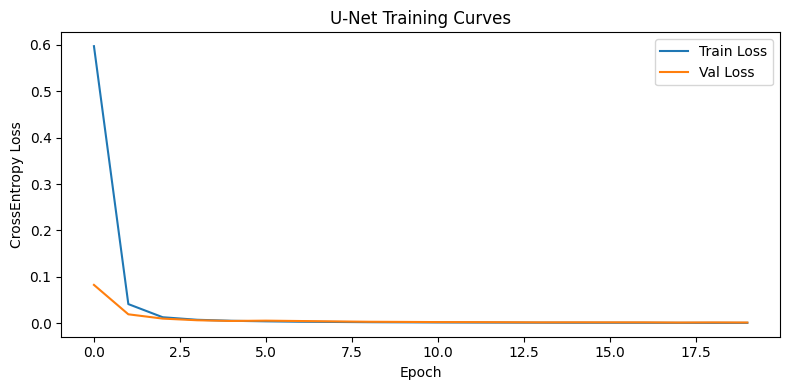

In [14]:
# Cell 5D — Plot training curves
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(history['train_loss'], label='Train Loss')
ax.plot(history['val_loss'], label='Val Loss')
ax.set_xlabel('Epoch'); ax.set_ylabel('CrossEntropy Loss')
ax.set_title('U-Net Training Curves'); ax.legend()
plt.tight_layout()
plt.savefig('unet_training_curves.png', bbox_inches='tight', dpi=120)
plt.show()
plt.close('all')

## SECTION 6 — SEGMENTATION EVALUATION

In [15]:
# Cell 6A — Segmentation metrics
def evaluate_segmentation(model, dataloader):
    conf = torch.zeros((NUM_CLASSES_SEG, NUM_CLASSES_SEG), dtype=torch.long)
    use_amp = torch.cuda.is_available()
    model.eval()
    with torch.inference_mode():
        for imgs, masks in dataloader:
            imgs = imgs.to(DEVICE, non_blocking=True)
            with torch.amp.autocast(device_type='cuda', enabled=use_amp):
                preds = model(imgs).argmax(dim=1)
            preds_cpu = preds.cpu()
            masks_cpu = masks.cpu()
            k = preds_cpu * NUM_CLASSES_SEG + masks_cpu
            conf += torch.bincount(k.view(-1), minlength=NUM_CLASSES_SEG ** 2).view(NUM_CLASSES_SEG, NUM_CLASSES_SEG)
    conf = conf.float()
    class_inter = torch.diag(conf)
    class_union = conf.sum(1) + conf.sum(0) - torch.diag(conf)
    class_total = conf.sum(1)
    class_correct = torch.diag(conf)
    class_iou = torch.zeros(NUM_CLASSES_SEG)
    valid = class_union > 0
    class_iou[valid] = class_inter[valid] / class_union[valid]
    class_px_acc = torch.zeros(NUM_CLASSES_SEG)
    valid2 = class_total > 0
    class_px_acc[valid2] = class_correct[valid2] / class_total[valid2]
    mean_iou = class_iou[valid].mean().item() if valid.any() else 0.0
    pixel_acc = (class_correct.sum() / conf.sum()).item() if conf.sum() > 0 else 0.0
    fg_mask = torch.zeros(NUM_CLASSES_SEG, dtype=torch.bool)
    fg_mask[1:] = True
    fg_valid = fg_mask & valid
    fg_correct = class_correct[fg_valid].sum()
    fg_total = class_total[fg_valid].sum()
    seg_accuracy = (fg_correct / (fg_total + 1e-8)).item() if fg_total > 0 else 0.0
    return class_iou.numpy(), class_px_acc.numpy(), mean_iou, pixel_acc, seg_accuracy

class_iou, class_px_acc, mean_iou, pixel_acc, seg_accuracy = evaluate_segmentation(unet, test_seg_dl)
CLASS_NAMES = ['Background'] + [f'Digit {i}' for i in range(10)]
print(f'Segmentation Accuracy (foreground): {seg_accuracy:.4f}')
print(f'Overall Pixel Accuracy: {pixel_acc:.4f}')
print(f'Mean IoU: {mean_iou:.4f}')
print()
print(f"{'Class':>12} | {'IoU':>8} | {'Px Acc':>8}")
print('-' * 36)
for c in range(NUM_CLASSES_SEG):
    print(f'{CLASS_NAMES[c]:>12} | {class_iou[c]:>8.4f} | {class_px_acc[c]:>8.4f}')

Segmentation Accuracy (foreground): 0.9745
Overall Pixel Accuracy: 0.9996
Mean IoU: 0.9595

       Class |      IoU |   Px Acc
------------------------------------
  Background |   0.9998 |   1.0000
     Digit 0 |   0.9656 |   0.9768
     Digit 1 |   0.9522 |   0.9743
     Digit 2 |   0.9625 |   0.9848
     Digit 3 |   0.9617 |   0.9801
     Digit 4 |   0.9469 |   0.9603
     Digit 5 |   0.9492 |   0.9630
     Digit 6 |   0.9606 |   0.9747
     Digit 7 |   0.9535 |   0.9707
     Digit 8 |   0.9626 |   0.9820
     Digit 9 |   0.9403 |   0.9723


## SECTION 7 — VISUALISATIONS

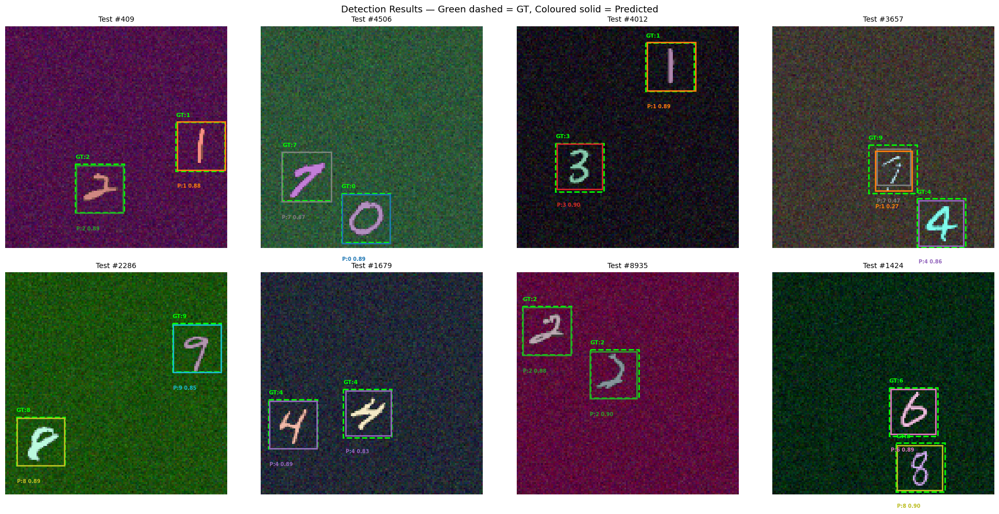

In [16]:
# Cell 7A — Detection results
COLORS = plt.cm.tab10.colors
def draw_det_comparison(img, gt_boxes, gt_labels, pred_result, ax):
    ax.imshow(img)
    for box, lbl in zip(gt_boxes, gt_labels):
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='lime', facecolor='none', linestyle='--')
        ax.add_patch(rect)
        ax.text(x1, y1-3, f'GT:{lbl}', color='lime', fontsize=8, weight='bold')
    if pred_result.boxes is not None and len(pred_result.boxes):
        pboxes = pred_result.boxes.xyxy.cpu().numpy()
        pcls = pred_result.boxes.cls.cpu().numpy().astype(int)
        pconf = pred_result.boxes.conf.cpu().numpy()
        for pb, pc, pf in zip(pboxes, pcls, pconf):
            col = COLORS[pc % 10]
            rect = patches.Rectangle((pb[0], pb[1]), pb[2]-pb[0], pb[3]-pb[1], linewidth=2, edgecolor=col, facecolor='none')
            ax.add_patch(rect)
            ax.text(pb[0], pb[3] + 10, f'P:{pc} {pf:.2f}', color=col, fontsize=7, weight='bold')
    ax.axis('off')
sample_ids = random.sample(range(NUM_TEST), min(8, NUM_TEST))
yolo_results_sample = []
for sid in sample_ids:
    img_path = os.path.join(DATASET_DIR, 'images', 'test', f'scene_{sid:05d}.png')
    res = detector.predict(source=img_path, imgsz=YOLO_IMGSZ, conf=0.25, verbose=False, device=0 if torch.cuda.is_available() else 'cpu')
    yolo_results_sample.append(res[0])
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for idx, (sid, ax) in enumerate(zip(sample_ids, axes.flat)):
    img_path = os.path.join(DATASET_DIR, 'images', 'test', f'scene_{sid:05d}.png')
    img_np = np.array(Image.open(img_path))
    draw_det_comparison(img_np, test_boxes[sid], test_labels[sid], yolo_results_sample[idx], ax)
    ax.set_title(f'Test #{sid}', fontsize=10)
plt.suptitle('Detection Results — Green dashed = GT, Coloured solid = Predicted', fontsize=13)
plt.tight_layout()
plt.savefig('yolo_detection_results.png', bbox_inches='tight', dpi=120)
plt.show()
plt.close('all')

W0323 00:13:17.588000 24 torch/_inductor/utils.py:1679] [4/0] Not enough SMs to use max_autotune_gemm mode


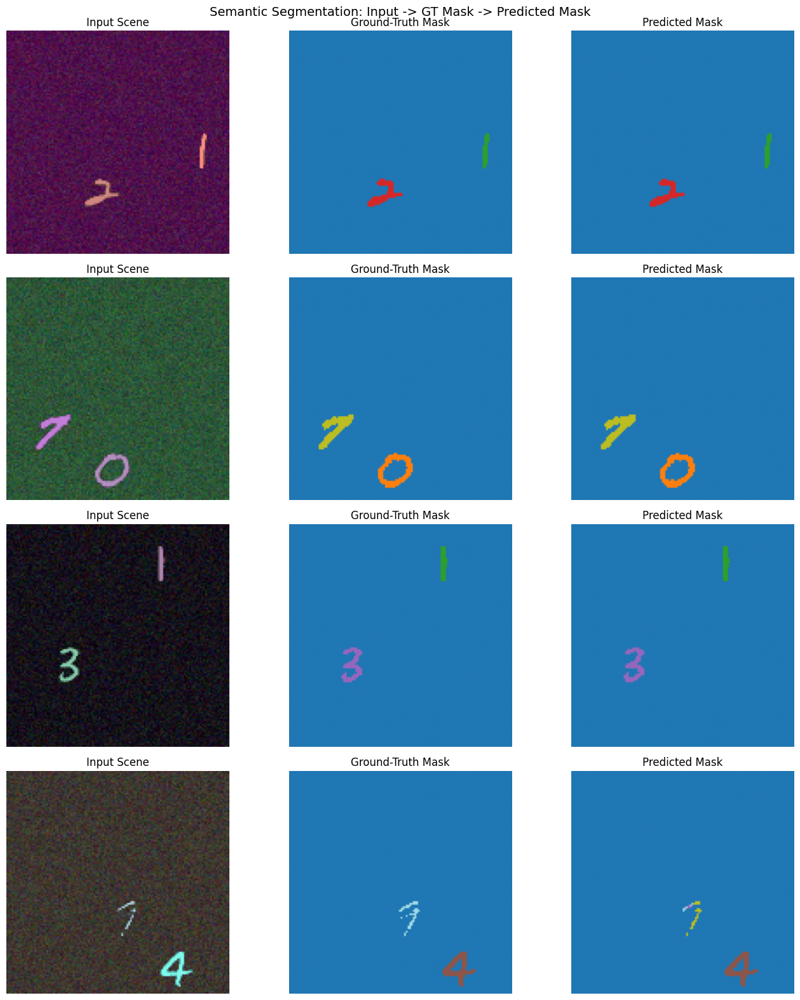

In [17]:
# Cell 7B — Segmentation results
seg_sample_ids = sample_ids[:4]
fig, axes = plt.subplots(len(seg_sample_ids), 3, figsize=(14, 4 * len(seg_sample_ids)))
if len(seg_sample_ids) == 1:
    axes = axes[np.newaxis, :]
for row, sid in enumerate(seg_sample_ids):
    img_path = os.path.join(DATASET_DIR, 'images', 'test', f'scene_{sid:05d}.png')
    mask_path = os.path.join(DATASET_DIR, 'masks', 'test', f'scene_{sid:05d}.png')
    img_pil = Image.open(img_path).convert('RGB')
    mask_np = np.array(Image.open(mask_path))
    img_np = np.array(img_pil)
    img_t = TF.to_tensor(img_pil).unsqueeze(0).to(DEVICE, non_blocking=True)
    with torch.inference_mode():
        pred_mask = unet(img_t).argmax(dim=1).squeeze().cpu().numpy()
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title('Input Scene')
    axes[row, 1].imshow(mask_np, cmap='tab20', vmin=0, vmax=10)
    axes[row, 1].set_title('Ground-Truth Mask')
    axes[row, 2].imshow(pred_mask, cmap='tab20', vmin=0, vmax=10)
    axes[row, 2].set_title('Predicted Mask')
    for ax in axes[row]:
        ax.axis('off')
    del img_pil
plt.suptitle('Semantic Segmentation: Input -> GT Mask -> Predicted Mask', fontsize=14)
plt.tight_layout()
plt.savefig('unet_segmentation_results.png', bbox_inches='tight', dpi=120)
plt.show()
plt.close('all')

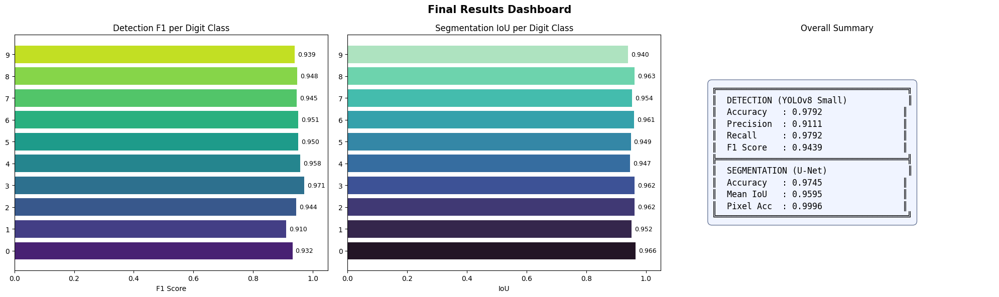

In [18]:
# Cell 7C — Results dashboard
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
det_f1s = [per_class_det[c]['f1'] for c in range(NUM_CLASSES_DET)]
axes[0].barh([str(c) for c in range(10)], det_f1s, color=sns.color_palette('viridis', 10))
axes[0].set_xlabel('F1 Score'); axes[0].set_title('Detection F1 per Digit Class')
axes[0].set_xlim(0, 1.05)
for i, v in enumerate(det_f1s):
    axes[0].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=9)
seg_ious = class_iou[1:]
axes[1].barh([str(c) for c in range(10)], seg_ious, color=sns.color_palette('mako', 10))
axes[1].set_xlabel('IoU'); axes[1].set_title('Segmentation IoU per Digit Class')
axes[1].set_xlim(0, 1.05)
for i, v in enumerate(seg_ious):
    axes[1].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=9)
axes[2].axis('off')
summary_text = (f'╔══════════════════════════════════════╗\n' f'║  DETECTION (YOLOv8 Small)            ║\n' f'║  Accuracy   : {det_accuracy:.4f}                ║\n' f'║  Precision  : {overall_prec:.4f}                ║\n' f'║  Recall     : {overall_rec:.4f}                ║\n' f'║  F1 Score   : {overall_f1:.4f}                ║\n' f'╠══════════════════════════════════════╣\n' f'║  SEGMENTATION (U-Net)                ║\n' f'║  Accuracy   : {seg_accuracy:.4f}                ║\n' f'║  Mean IoU   : {mean_iou:.4f}                ║\n' f'║  Pixel Acc  : {pixel_acc:.4f}                ║\n' f'╚══════════════════════════════════════╝')
axes[2].text(0.1, 0.5, summary_text, fontsize=12, fontfamily='monospace', verticalalignment='center', transform=axes[2].transAxes, bbox=dict(boxstyle='round,pad=0.5', facecolor='#f0f4ff', edgecolor='#6c7a99'))
axes[2].set_title('Overall Summary')
plt.suptitle('Final Results Dashboard', fontsize=15, weight='bold')
plt.tight_layout()
plt.savefig('final_results_dashboard.png', bbox_inches='tight', dpi=120)
plt.show()
plt.close('all')

## SECTION 8 — GENERALISATION TEST

Generated 6 official MNISTDD-RGB test scenes from held-out MNIST indices 5000-9999.


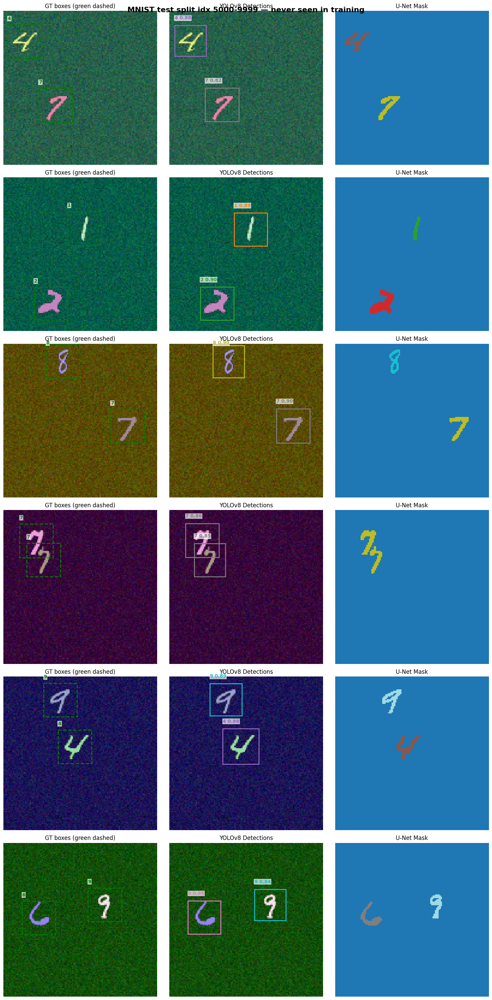

In [19]:
# Cell 8A — Inference on held-out MNIST test scenes
os.makedirs(OFFICIAL_TEST_DIR, exist_ok=True)
for f in glob.glob(os.path.join(OFFICIAL_TEST_DIR, '*')):
    try:
        os.remove(f)
    except OSError:
        pass
_ot_img = os.path.join(OFFICIAL_TEST_DIR, 'images')
_ot_mask = os.path.join(OFFICIAL_TEST_DIR, 'masks')
_ot_lbl = os.path.join(OFFICIAL_TEST_DIR, 'labels')
os.makedirs(_ot_img, exist_ok=True)
os.makedirs(_ot_mask, exist_ok=True)
os.makedirs(_ot_lbl, exist_ok=True)
mnist_test_fresh_imgs = _mnist_test_imgs[5000:10000]
mnist_test_fresh_labels = _mnist_test_labels[5000:10000]
generated_samples = []
for i in range(6):
    fname = f'official_scene_{i:02d}'
    boxes, labels = generate_and_save_scene(mnist_test_fresh_imgs, mnist_test_fresh_labels, fname, _ot_img, _ot_mask, _ot_lbl)
    generated_samples.append((os.path.join(_ot_img, fname + '.png'), boxes, labels))
official_imgs = [p for p, _, _ in generated_samples]
print(f'Generated {len(official_imgs)} official MNISTDD-RGB test scenes from held-out MNIST indices 5000-9999.')
if not official_imgs:
    print(f'No images generated in {OFFICIAL_TEST_DIR}.')
else:
    n_vis = len(official_imgs)
    fig, axes = plt.subplots(n_vis, 3, figsize=(15, 5 * n_vis))
    if n_vis == 1:
        axes = axes[np.newaxis, :]
    unet.eval()
    COLORS = plt.cm.tab10.colors
    for row, (img_path, gt_boxes, gt_labels) in enumerate(generated_samples):
        img_pil = Image.open(img_path).convert('RGB')
        img_np = np.array(img_pil)
        axes[row, 0].imshow(img_np)
        for (x1, y1, x2, y2), lbl in zip(gt_boxes, gt_labels):
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='green', facecolor='none', linestyle='--')
            axes[row, 0].add_patch(rect)
            axes[row, 0].text(x1, max(y1 - 4, 0), f'{lbl}', color='green', fontsize=10, weight='bold', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
        axes[row, 0].set_title('GT boxes (green dashed)')
        axes[row, 0].axis('off')
        det_res = detector.predict(source=img_pil, imgsz=YOLO_IMGSZ, conf=0.25, verbose=False, device=0 if torch.cuda.is_available() else 'cpu')[0]
        axes[row, 1].imshow(img_np)
        if det_res.boxes is not None and len(det_res.boxes):
            pboxes = det_res.boxes.xyxy.cpu().numpy()
            pcls = det_res.boxes.cls.cpu().numpy().astype(int)
            pconf = det_res.boxes.conf.cpu().numpy()
            for pb, pc, pf in zip(pboxes, pcls, pconf):
                col = COLORS[pc % len(COLORS)]
                rect = patches.Rectangle((pb[0], pb[1]), pb[2]-pb[0], pb[3]-pb[1], linewidth=2, edgecolor=col, facecolor='none')
                axes[row, 1].add_patch(rect)
                axes[row, 1].text(pb[0], max(pb[1]-5, 0), f'{pc} {pf:.2f}', color=col, fontsize=10, weight='bold', bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
        axes[row, 1].set_title('YOLOv8 Detections')
        axes[row, 1].axis('off')
        img_t = TF.to_tensor(img_pil).unsqueeze(0).to(DEVICE, non_blocking=True)
        with torch.inference_mode():
            pred_mask = unet(img_t).argmax(dim=1).squeeze().cpu().numpy()
        axes[row, 2].imshow(pred_mask, cmap='tab20', vmin=0, vmax=10)
        axes[row, 2].set_title('U-Net Mask')
        axes[row, 2].axis('off')
        del img_pil
    plt.suptitle('MNIST test split idx 5000-9999 — never seen in training', fontsize=16, weight='bold')
    plt.tight_layout()
    plt.savefig('external_data_predictions.png', bbox_inches='tight', dpi=120)
    plt.savefig('official_predictions.png', bbox_inches='tight', dpi=120)
    plt.show()
    plt.close('all')

## SECTION 9 — FINAL REPORT

In [20]:
# Cell 9A — Text report
report = []
report.append('=' * 65)
report.append('  BCO074C MINOR PROJECT — FINAL RESULTS REPORT')
report.append('=' * 65)
report.append('')
report.append('─── OBJECT DETECTION (YOLOv8 Small) ───')
report.append(f'  Detection Accuracy : {det_accuracy:.4f}  ({det_total_correct}/{det_total_gt} objects)')
report.append(f'  Overall Precision  : {overall_prec:.4f}')
report.append(f'  Overall Recall     : {overall_rec:.4f}')
report.append(f'  Overall F1 Score   : {overall_f1:.4f}')
report.append('')
report.append(f"  {'Class':>6} | {'Precision':>9} | {'Recall':>8} | {'F1':>8}")
report.append('  ' + '-' * 42)
for c in range(NUM_CLASSES_DET):
    p = per_class_det[c]
    report.append(f"  {c:>6} | {p['precision']:>9.4f} | {p['recall']:>8.4f} | {p['f1']:>8.4f}")
report.append('')
report.append('─── SEMANTIC SEGMENTATION (U-Net) ───')
report.append(f'  Seg Accuracy (fg)  : {seg_accuracy:.4f}')
report.append(f'  Mean IoU           : {mean_iou:.4f}')
report.append(f'  Pixel Accuracy     : {pixel_acc:.4f}')
report.append('')
report.append(f"  {'Class':>12} | {'IoU':>8} | {'Pixel Acc':>9}")
report.append('  ' + '-' * 36)
for c in range(NUM_CLASSES_SEG):
    report.append(f"  {CLASS_NAMES[c]:>12} | {class_iou[c]:>8.4f} | {class_px_acc[c]:>9.4f}")
report.append('')
report.append('=' * 65)
report.append('  END OF REPORT')
report.append('=' * 65)
report_text = '\n'.join(report)
print(report_text)
with open('results_report.txt', 'w') as f:
    f.write(report_text)
print('Report also saved to results_report.txt')

  BCO074C MINOR PROJECT — FINAL RESULTS REPORT

─── OBJECT DETECTION (YOLOv8 Small) ───
  Detection Accuracy : 0.9792  (19585/20000 objects)
  Overall Precision  : 0.9111
  Overall Recall     : 0.9792
  Overall F1 Score   : 0.9439

   Class | Precision |   Recall |       F1
  ------------------------------------------
       0 |    0.8770 |   0.9938 |   0.9318
       1 |    0.8515 |   0.9783 |   0.9105
       2 |    0.9116 |   0.9786 |   0.9439
       3 |    0.9589 |   0.9827 |   0.9706
       4 |    0.9337 |   0.9831 |   0.9577
       5 |    0.9268 |   0.9753 |   0.9504
       6 |    0.9254 |   0.9778 |   0.9509
       7 |    0.9072 |   0.9870 |   0.9454
       8 |    0.9213 |   0.9760 |   0.9478
       9 |    0.9186 |   0.9603 |   0.9390

─── SEMANTIC SEGMENTATION (U-Net) ───
  Seg Accuracy (fg)  : 0.9745
  Mean IoU           : 0.9595
  Pixel Accuracy     : 0.9996

         Class |      IoU | Pixel Acc
  ------------------------------------
    Background |   0.9998 |    1.0000
     

## SECTION 10 — DISPLAY ALL OUTPUTS

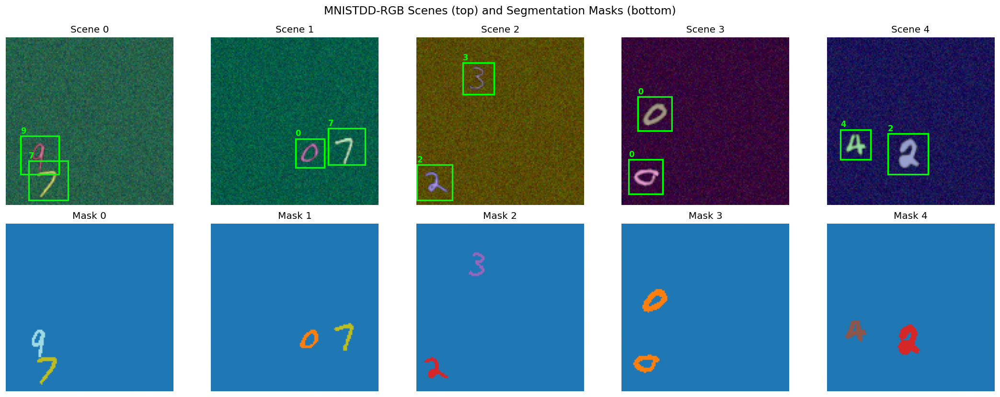

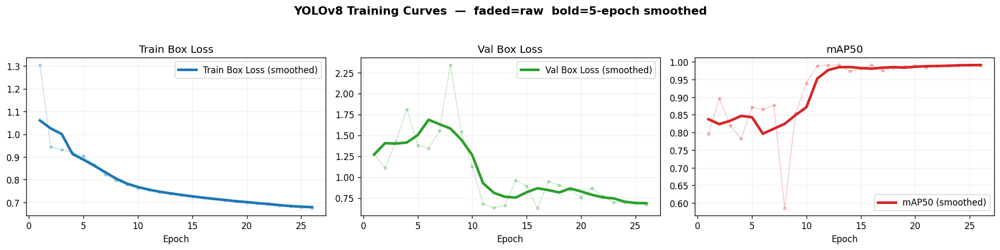

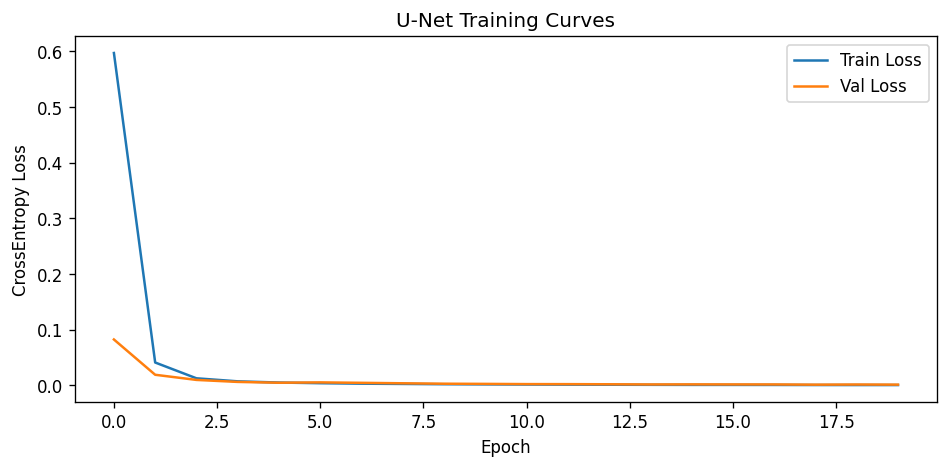

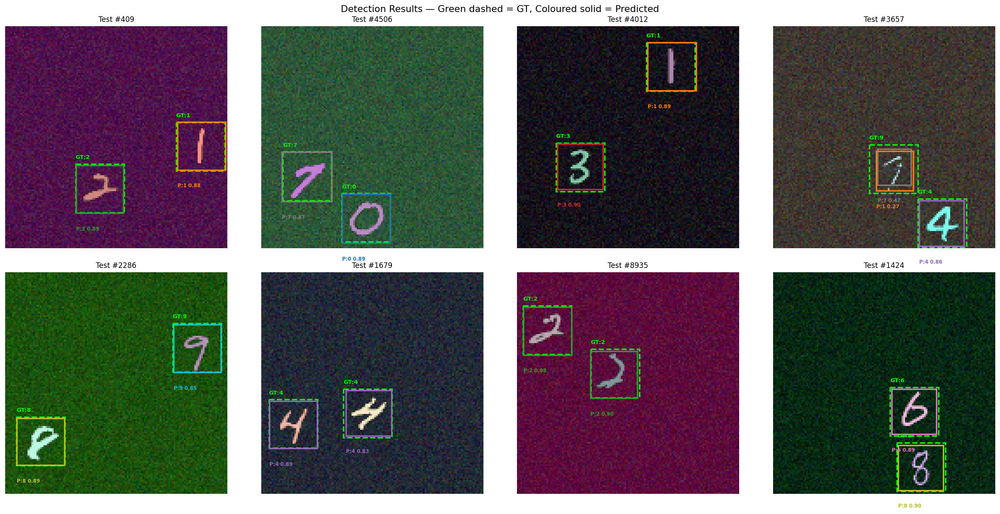

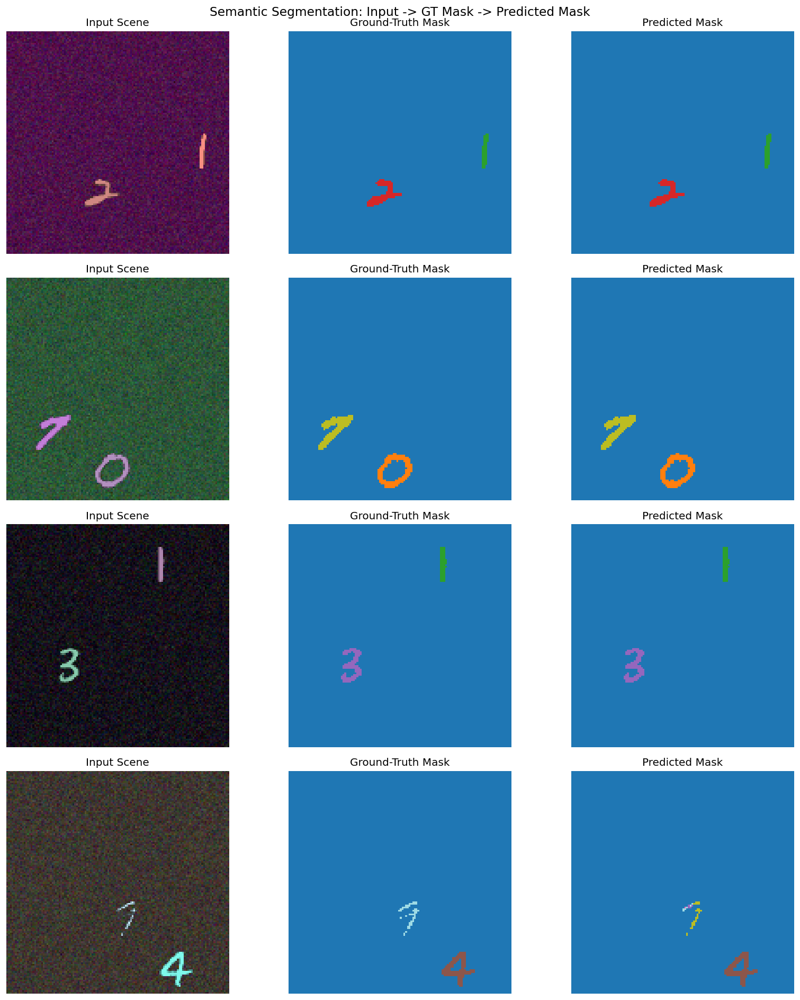

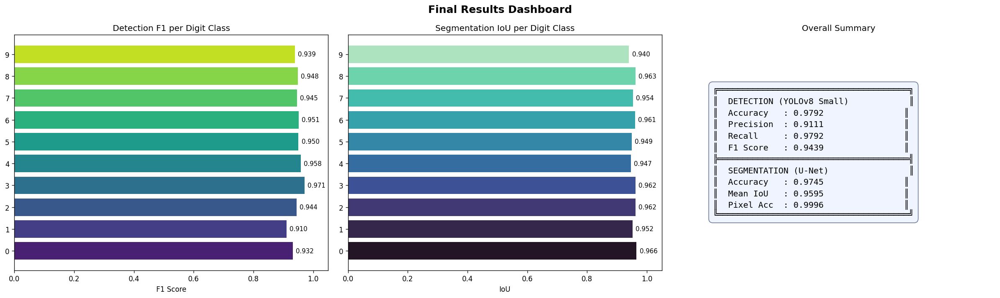

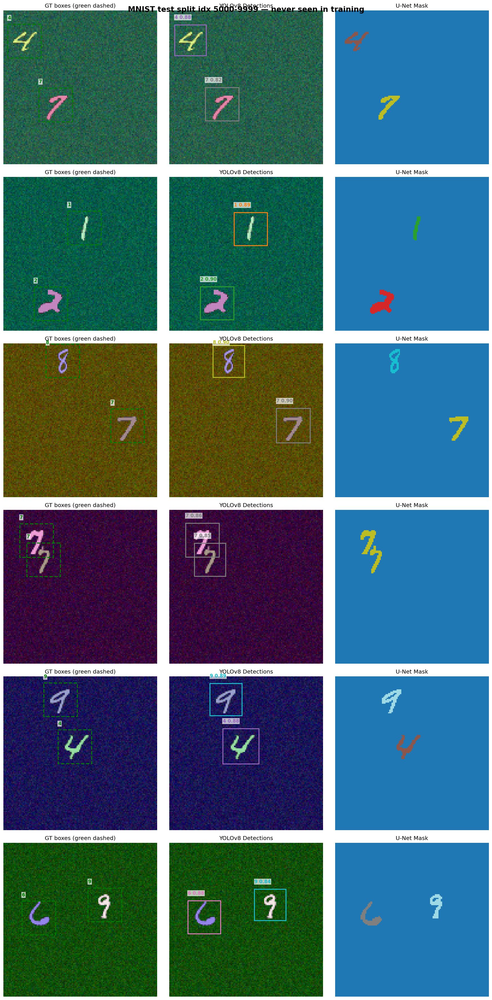

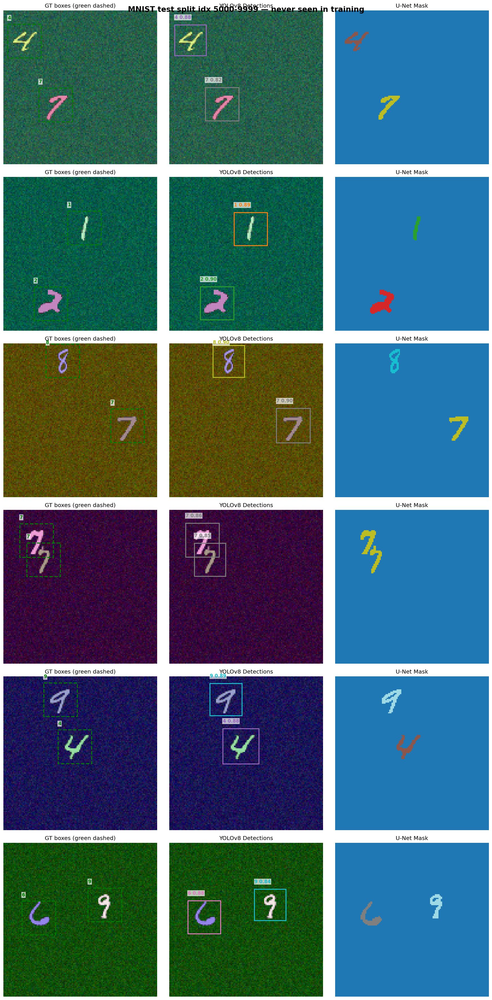

In [21]:
# Cell 10A — Inline display
output_pngs = ['mnistdd_rgb_samples.png', 'yolo_training_curves.png', 'unet_training_curves.png', 'yolo_detection_results.png', 'unet_segmentation_results.png', 'final_results_dashboard.png', 'external_data_predictions.png', 'official_predictions.png']
for p in output_pngs:
    if os.path.exists(p):
        display(IPyImage(filename=p))
    else:
        print(f'WARNING: missing output image -> {p}')